<a href="https://colab.research.google.com/github/AISHWARYAARULSELVAN/IPCV/blob/main/EXP_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
from google.colab import files
uploaded = files.upload()

Saving CAM4.PNG to CAM4.PNG
Saving CAM5.PNG to CAM5.PNG
Saving CAM3.PNG to CAM3 (1).PNG
Saving CAM2.PNG to CAM2 (1).PNG
Saving CAM7.PNG to CAM7 (1).PNG


Found images: ['/content/CAM7 (1).PNG', '/content/CAM4.PNG', '/content/CAM3.PNG', '/content/CAM2 (1).PNG', '/content/CAM3 (1).PNG', '/content/CAM5.PNG', '/content/CAM7.PNG', '/content/CAM2.PNG']
Chessboard not detected in: /content/CAM7 (1).PNG


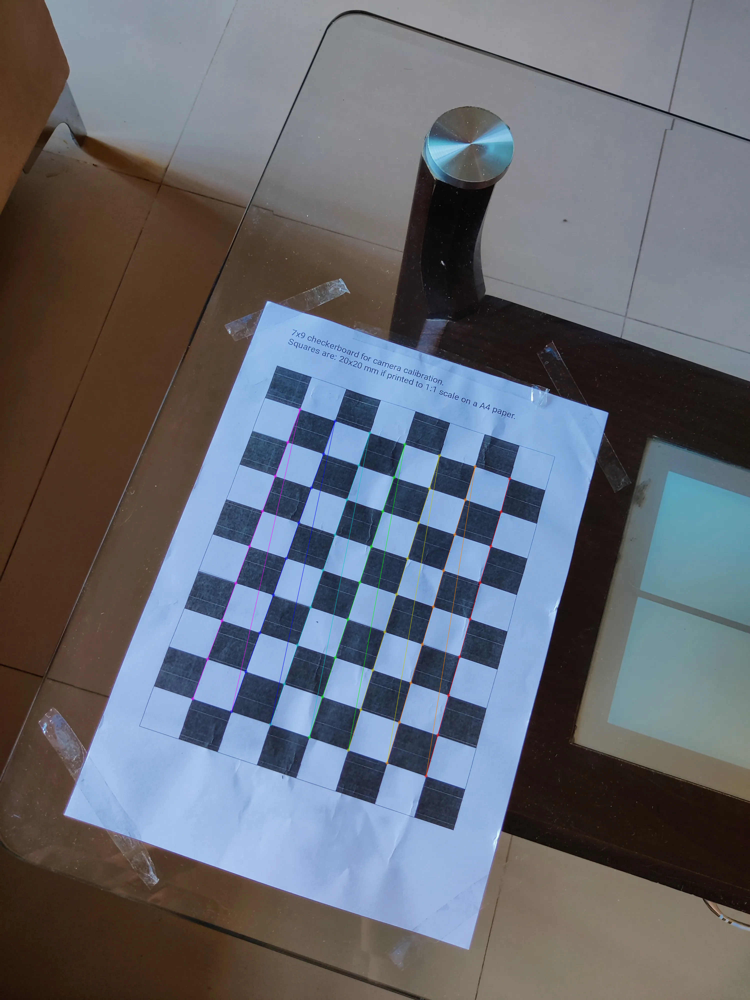

Chessboard not detected in: /content/CAM3.PNG
Chessboard not detected in: /content/CAM2 (1).PNG
Chessboard not detected in: /content/CAM3 (1).PNG


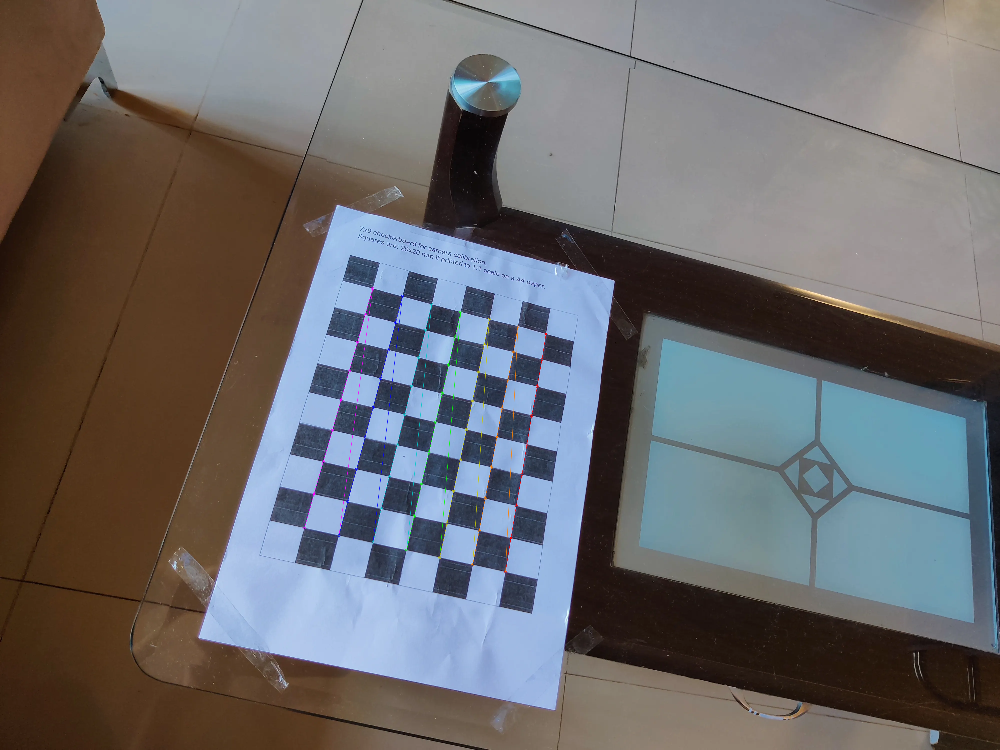

Chessboard not detected in: /content/CAM7.PNG
Chessboard not detected in: /content/CAM2.PNG

Camera matrix (K):
 [[6.06142280e+03 0.00000000e+00 1.53669513e+03]
 [0.00000000e+00 7.03223983e+03 1.67954643e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Distortion coefficients (D):
 [[-2.29367937e+00  3.17493127e+01  7.54764627e-02 -6.42641241e-02
  -1.91333232e+02]]


In [23]:
#!/usr/bin/env python
import cv2
import glob
import numpy as np
import os
from google.colab.patches import cv2_imshow

# Inputs
num_squares_x = 8
num_squares_y = 10

num_interior_corners_x = num_squares_x - 1
num_interior_corners_y = num_squares_y - 1

checker_width = 0.020

# Path in Colab
path = "/content"

def calibrate():

    termination_criteria = (
        cv2.TERM_CRITERIA_EPS +
        cv2.TERM_CRITERIA_MAX_ITER,
        30,
        0.001
    )

    object_points_3D = np.zeros(
        (num_interior_corners_x * num_interior_corners_y, 3),
        np.float32
    )

    object_points_3D[:, :2] = np.mgrid[
        0:num_interior_corners_y,
        0:num_interior_corners_x
    ].T.reshape(-1, 2)

    object_points_3D *= checker_width

    object_points = []
    image_points = []

    images = glob.glob(os.path.join(path, '*.PNG')) + \
         glob.glob(os.path.join(path, '*.png'))

    print("Found images:", images)

    for image_file in images:

        image = cv2.imread(image_file)

        if image is None:
            print("Skipping unreadable image:", image_file)
            continue

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        success, corners = cv2.findChessboardCorners(
            gray,
            (num_interior_corners_y, num_interior_corners_x),
            None
        )

        if success:

            object_points.append(object_points_3D)

            corners_2 = cv2.cornerSubPix(
                gray,
                corners,
                (11, 11),
                (-1, -1),
                termination_criteria
            )

            image_points.append(corners_2)

            cv2.drawChessboardCorners(
                image,
                (num_interior_corners_y, num_interior_corners_x),
                corners_2,
                success
            )

            cv2_imshow(image)

        else:
            print("Chessboard not detected in:", image_file)

    if len(object_points) == 0:
        print("No chessboard corners detected in any image!")
        return

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
        object_points,
        image_points,
        gray.shape[::-1],
        None,
        None
    )

    cv_file = cv2.FileStorage(
        'calibration_chessboard_colab.yaml',
        cv2.FILE_STORAGE_WRITE
    )

    cv_file.write('K', mtx)
    cv_file.write('D', dist)

    cv_file.release()

    cv_file = cv2.FileStorage(
        'calibration_chessboard_colab.yaml',
        cv2.FILE_STORAGE_READ
    )

    mtx_loaded = cv_file.getNode('K').mat()
    dist_loaded = cv_file.getNode('D').mat()

    cv_file.release()

    print("\nCamera matrix (K):\n", mtx_loaded)
    print("\nDistortion coefficients (D):\n", dist_loaded)

    cv2.destroyAllWindows()

def main():
    calibrate()

if __name__ == '__main__':
    main()